# Load libraries

In [1]:
import pandas as pd 
import scanpy as sc 

In [2]:
#Versions for the loaded packages
print('\n'.join(f'{m.__name__}=={m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))

pandas==1.4.3
scanpy==1.9.2


# Read data

In [3]:
# https://zenodo.org/record/6998285#.ZCRHbhVBzMv
# NCB_2022_final_integrated_dataset.h5ad
# md5:314f969a51cc21751e8754a726d1d7e9

adata = sc.read_h5ad('NCB_2022_final_integrated_dataset.h5ad')

# Subset basal cells
adata_basal = adata[adata.obs["Location"] == "Basal"].copy()

In [4]:
# List of calcium-related genes
ca_list = pd.read_csv("calcium_genes.csv", header=None)[0].tolist()

# Analysis

## Metadata

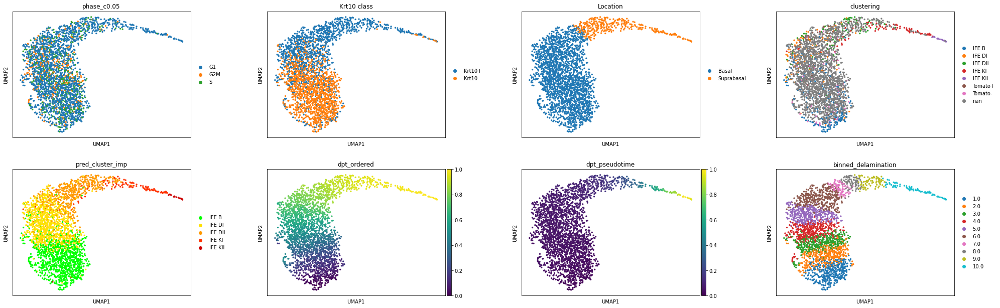

In [5]:
sc.pl.umap(adata, color=['phase_c0.05','Krt10 class', 'Location', 'clustering','pred_cluster_imp', 'dpt_ordered', 'dpt_pseudotime', 'binned_delamination'], wspace = 0.3)

## Calcium genes

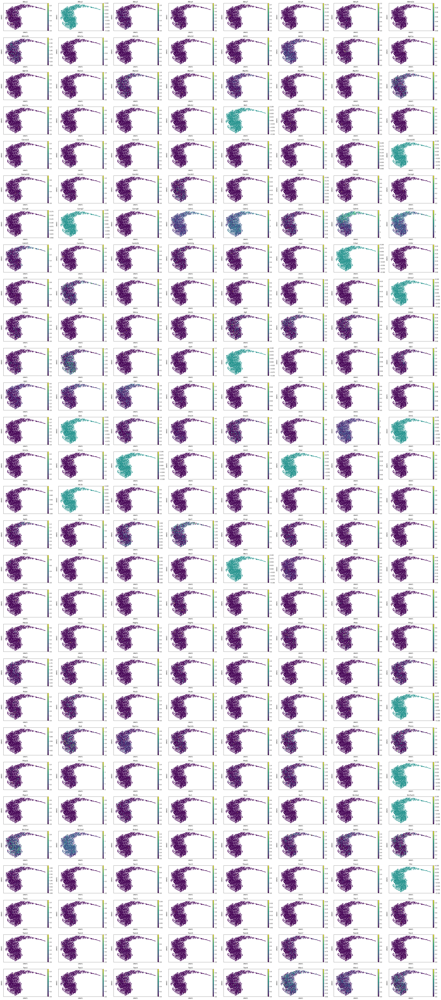

In [6]:
sc.pl.umap(adata, color=ca_list, ncols=8)

## Differentially expressed genes

### DEGs by phase

In [7]:
sc.tl.rank_genes_groups(adata_basal, groupby='phase_c0.05', key_added = 'by_phase')
deg_g1  = sc.get.rank_genes_groups_df(adata_basal, group='G1',  key='by_phase')
deg_g2m = sc.get.rank_genes_groups_df(adata_basal, group='G2M', key='by_phase')
deg_s   = sc.get.rank_genes_groups_df(adata_basal, group='S',   key='by_phase')

In [8]:
top10_each = {}
top10_each["Top 10 DEGs G1"]   = deg_g1 [deg_g1 ['names'].isin(ca_list)][:10]['names'].tolist()  
top10_each["Top 10 DEGs S"]    = deg_s  [deg_s  ['names'].isin(ca_list)][:10]['names'].tolist()
top10_each["Top 10 DEGs G2/M"] = deg_g2m[deg_g2m['names'].isin(ca_list)][:10]['names'].tolist() 

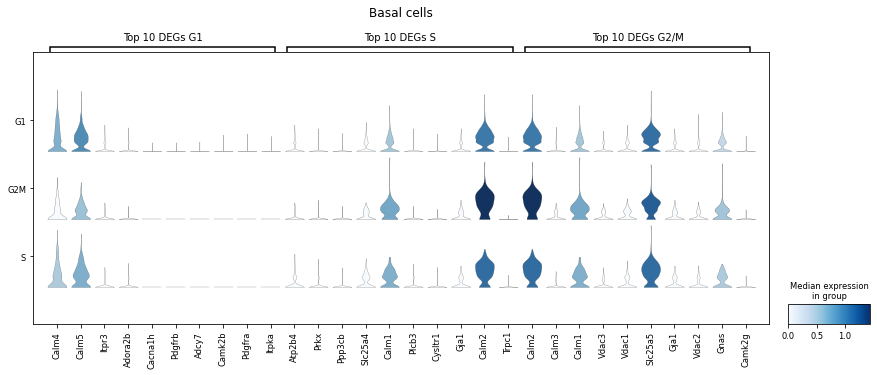

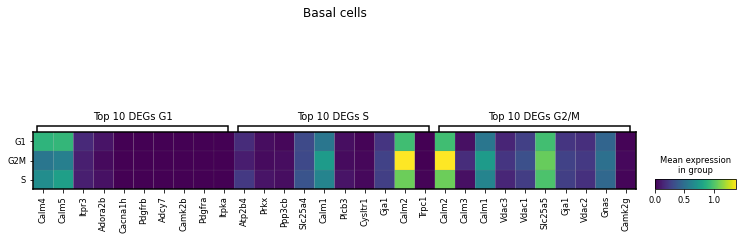

In [9]:
sc.pl.stacked_violin(adata_basal, top10_each, groupby="phase_c0.05", figsize=[15,5], var_group_rotation = 0, title="Basal cells\n\n")
sc.pl.matrixplot(adata_basal, top10_each, groupby="phase_c0.05", var_group_rotation = 0, title="Basal cells\n\n")

### DEGs by cycling status

In [10]:
adata_basal.obs['G2M_vs_G1S'] = "G1/S"
adata_basal.obs.loc[adata_basal.obs['phase_c0.05']=='G2M','G2M_vs_G1S'] = 'G2/M'
sc.tl.rank_genes_groups(adata_basal, groupby='G2M_vs_G1S', reference='G1/S')

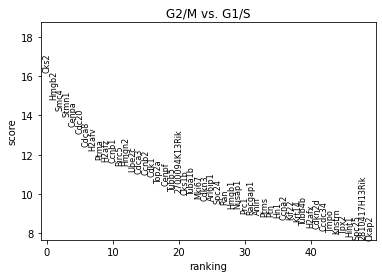

In [11]:
sc.pl.rank_genes_groups(adata_basal, n_genes=50)

**Supplemental Table S1**

In [12]:
deg = sc.get.rank_genes_groups_df(adata_basal, group='G2/M')
deg_ca = deg[deg['names'].isin(ca_list)]
deg_ca

,names,scores,logfoldchanges,pvals,pvals_adj
52,Calm2,7.456533,0.844273,9.150128e-13,3.197582e-10
93,Calm3,6.170392,1.734861,2.255065e-09,4.008184e-07
168,Calm1,4.980552,0.602955,1.032481e-06,9.764999e-05
387,Vdac3,3.258908,0.605198,1.235190e-03,3.273412e-02
480,Vdac1,2.926757,0.441849,3.663684e-03,7.362362e-02
...,...,...,...,...,...
20431,Trpv3,-3.812665,-22.189800,1.415505e-04,6.386187e-03
20432,Camk4,-3.814043,-22.296734,1.407685e-04,6.364835e-03
20455,Gjb3,-3.907337,-0.914840,1.079349e-04,5.192989e-03
20596,Calm4,-6.132596,-0.921602,2.156888e-09,3.867018e-07


## Violin plot

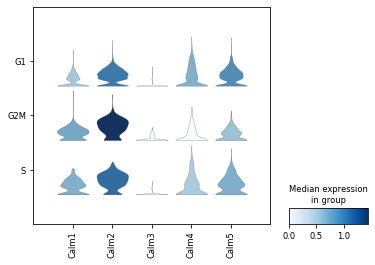

In [13]:
sc.pl.stacked_violin(adata_basal, ['Calm1','Calm2','Calm3','Calm4','Calm5'], groupby="phase_c0.05", figsize=[6,4])

## Matrix plot
**Supplemental Figure S6A**

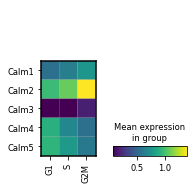

In [14]:
sc.pl.matrixplot(adata_basal, ['Calm1','Calm2','Calm3','Calm4','Calm5'], 
                 groupby='phase_c0.05', swap_axes=True, categories_order =['G1','S','G2M'])